<a href="https://colab.research.google.com/github/whateveri/models/blob/2d_PPDM_CelebA/2dDDPM_colored.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import math,random
from matplotlib import pyplot as plt
from matplotlib import animation

device="cuda" if torch.cuda.is_available() else "cpu"

In [2]:
from os import times
def linear_bate_schedule(timesteps,start=1e-4,end=2e-2):
    return torch.linspace(start=start,end=end,steps=timesteps)

T=800
betas=linear_bate_schedule(T).to(device)
alphas=1.-betas
alphas_cumprod=torch.cumprod(alphas,dim=0)

In [24]:
#time embedding

class Time_Position(nn.Module):

    def __init__(self, dim):
        super().__init__()

        self.dim=dim

    def forward(self,pos): #pos shape (half)
        device=pos.device
        half= self.dim //2
        i=torch.arange(0,half,device=device).float()
        f=torch.exp(-math.log(10000) * (i/half)) # f shape (half)
        #       (half,1)                     (1,half)
        arg=pos.float().unsqueeze(1) * f.unsqueeze(0)
        emb=torch.cat([torch.sin(arg),torch.cos(arg)],dim=-1)
        print(emb.shape)
        return emb


# Unet

  #resblock

    #convBlock

class convBlock(nn.Module):

    def __init__(self, in_size,out_size,kernel_size,n_group,padding) -> None:
        super().__init__()
        n_group=min(1,in_size)
        self.norm=nn.GroupNorm(num_groups=n_group,num_channels=in_size)

        self.act=nn.SiLU();

        self.conv2d=nn.Conv2d(in_channels=in_size, out_channels= out_size,kernel_size=kernel_size , padding= padding)

    def forward(self,x):
        out=self.norm(x)
        out=self.act(out)
        out=self.conv2d(out)

        return out


class resBlock(nn.Module):
    def __init__(self, in_size,out_size,t_dim) -> None:
        super().__init__()
        self.conv_in=convBlock(in_size=in_size,out_size=out_size,kernel_size=3,n_group=8,padding=1)
        self.embed_mlp= nn.Linear(in_features=t_dim,out_features=out_size)

        self.conv_out=convBlock(in_size=out_size,out_size=out_size,kernel_size=3,n_group=8,padding=1)

        self.residule= (nn.Conv2d(in_channels=in_size, out_channels=out_size,kernel_size=1) if in_size != out_size else nn.Identity())


    def forward(self,x,t_emb):
        t=F.silu(t_emb)
        t=self.embed_mlp(t) [:,:,None,None]

        h=self.conv_in(x)
        h=h+t
        h=self.conv_out(h)
        x=self.residule(x)
        result=h+x
        return result

class SmallUnet(nn.Module):

    def __init__(self, in_size=3,base=64,time_dim=512) :
        super().__init__()

        self.time_embed=nn.Sequential(
            Time_Position(time_dim),
            nn.Linear(in_features=time_dim,out_features=in_size),
            nn.SiLU()

        )
        #downSampling
        self.resBlock1=resBlock(in_size=in_size,out_size=base,t_dim=time_dim)
        self.down1=nn.Conv2d(in_channels=base,out_channels=base*2,kernel_size=4,stride=2,padding=1)
        self.resBlock2=resBlock(in_size=base*2, out_size=base*2,t_dim=time_dim)

        self.down2=nn.Conv2d(in_channels=base*2,out_channels=base*4,kernel_size=4,stride=2,padding=1)

        self.resBlock3=resBlock(in_size=base*4,out_size=base*4,t_dim=time_dim)

        self.middle=resBlock(in_size=base*4,out_size=base*4,t_dim=time_dim)

        self.up1=nn.ConvTranspose2d(in_channels=base*4,out_channels=base*2,kernel_size=4,stride=2,padding=1)

        self.resBlock4=resBlock(in_size=base*4,out_size=base*2,t_dim=time_dim)

        self.up2=nn.ConvTranspose2d(in_channels=base*2,out_channels=base,kernel_size=4,stride=2,padding=1)

        self.resBlock5=resBlock(in_size=base*2,out_size=base,t_dim=time_dim)

        self.out=nn.Sequential(
            nn.GroupNorm(num_groups=8,num_channels=base),
            nn.SiLU(),
            nn.Conv2d(in_channels=base, out_channels=in_size,kernel_size=3,padding=1)
        )

    def forward(self,x,t):
        temb=self.time_embed(t)
        h1=self.resBlock1(x,temb)
        d1=self.down1(h1)
        h2=self.resBlock2(d1,temb)
        d2=self.down2(h2)
        h3=self.resBlock3(d2,temb)

        mid=self.middle(h3,temb)

        u1=self.up1(mid)
        cat1=torch.cat([u1,h2],dim=1)
        h4=self.resBlock4(cat1,temb)
        u2=self.up2(h4)
        cat2=torch.cat([u2,h2],dim=1)
        h5=self.resBlock5(cat2,temb)

        out=self.out(h5)

        return out

In [3]:
#time embedding
class SinusodialPosEmb(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim=dim

    def forward(self,pos):
        device=pos.device
        half=self.dim //2
        freq=torch.exp(-math.log(10000) * torch.arange(0,half,device=device).float() / half  )
        args=pos.float().unsqueeze(1)* freq.unsqueeze(0)
        emb=torch.cat([torch.sin(args),torch.cos(args)],dim=-1)
        return emb

#simple UNet(PixelCNN++ as backbone, a UNet based on Wide ResNet)




#resBlock


def rearrange_dims(tensor:torch.tensor):
    if len(tensor.shape)==2:
        return tensor[:,:,None]

    elif len(tensor.shape)==3:
        return tensor[:,:,None,None]
    elif len(tensor.shape)==4:
        return tensor[:,:,0,:]
    else:
        raise ValueError(f'error:{len(tensor.shape)}should be 2 or 3 or4')


#conv2DBlock

class conv2DBlock(nn.Module):

    def __init__(self, in_size, out_size, kernel_size, n_group,padding):
        super().__init__()
        self.conv2d=nn.Conv2d(in_size,out_size,kernel_size=kernel_size,padding=padding)

        n_group=min(in_size,1)
        self.norm=nn.GroupNorm(num_groups=n_group,num_channels=in_size)

        self.activ=nn.SiLU()

    def forward(self,x):
        out=self.norm(x)
        out=self.activ(out)
        out=self.conv2d(out)
        return out







class resBlock(nn.Module):
    def __init__(self, in_size,out_size,time_dim) :
        super().__init__()


        self.convBlock_in=conv2DBlock(in_size,out_size,kernel_size=3,n_group=8,padding=1)
        self.convBlock_out=conv2DBlock(out_size,out_size,kernel_size=3,n_group=8 ,padding=1)


        self.time_mlp=nn.Linear(time_dim,out_size)

        self.residual_conv=(
            nn.Conv2d(in_size,out_size,kernel_size=1) if in_size != out_size else nn.Identity()
        )


    def forward(self,x,t_emb):
        """
        x:(B,H=input_size,W)
        time_emb:(B,time_dim)
        """

        t_emb=F.silu(t_emb)

        time_emb=self.time_mlp(t_emb)[:,:,None,None]



        h=self.convBlock_in(x)

        print(f'h shape:{h.shape}, time_emb shape:{time_emb.shape}')
        ##h=h+ rearrange_dims(time_emb)
        h=h + time_emb


        h=self.convBlock_out(h)

        x=self.residual_conv(x)

        return h+x



class SmallUNet(nn.Module):
    def __init__(self, in_size=3, base=64, time_dim=512): #in_channel size=1:gray image
        super().__init__()
        self.time_embed=nn.Sequential(SinusodialPosEmb(time_dim),nn.Linear(time_dim,time_dim),nn.SiLU())

        #downSampling

        self.resBlock1=resBlock(in_size=in_size,out_size=base,time_dim=time_dim)

        self.down1=nn.Conv2d(base,base*2,4,stride=2,padding=1)

        self.resBlock2=resBlock(in_size=base*2,out_size=base*2,time_dim=time_dim)

        self.down2=nn.Conv2d(base*2,base*4,kernel_size=4,stride=2,padding=1)

        self.resBlock3=resBlock(in_size=base*4,out_size=base*4,time_dim=time_dim)

        #middle
        self.mid=resBlock(in_size=base*4,out_size=base*4,time_dim=time_dim)

        # upSampling

        self.up1=nn.ConvTranspose2d(base*4,base*2,kernel_size=4,stride=2,padding=1)

        self.resBlock4=resBlock(in_size=4*base,out_size=base*2,time_dim=time_dim)

        self.up2=nn.ConvTranspose2d(base*2,base,kernel_size=4,stride=2,padding=1)

        self.resBlock5=resBlock(in_size=base*2,out_size=base,time_dim=time_dim)

        #64channels -> input channels,size unchanged
        self.out=nn.Sequential(nn.GroupNorm(8,base), nn.SiLU(), nn.Conv2d(base,in_size,kernel_size=3,padding=1))


    def forward(self,x,t):
        temb=self.time_embed(t)
        h1=self.resBlock1(x,temb)
        d1=self.down1(h1)
        h2=self.resBlock2(d1,temb)
        d2=self.down2(h2)
        h3=self.resBlock3(d2,temb)
        h_mid=self.mid(h3,temb)
        u1=self.up1(h_mid)
        #copy and crop
        cat1=torch.cat([u1,h2],dim=1)

        h4=self.resBlock4(cat1,temb)
        u2=self.up2(h4)
        cat2=torch.cat([u2,h1],dim=1)
        h5=self.resBlock5(cat2,temb)
        out=self.out(h5)

        return out





In [4]:
#handle the dataset
import kagglehub
import os

# Download latest version
path = kagglehub.dataset_download("jessicali9530/celeba-dataset")

print("Path to dataset files:", path)

Using Colab cache for faster access to the 'celeba-dataset' dataset.
Path to dataset files: /kaggle/input/celeba-dataset


In [5]:

#check if file empty
if os.path.exists(path):
    if not os.listdir(os.path.join(path,"img_align_celeba","img_align_celeba")):
        print(' empty file')
    else:
        print('not empty file')
else:
    print('file path not exist')

not empty file


In [6]:
#customize dataset and dataloader

from torch.utils.data import DataLoader
from torchvision import datasets,transforms
import numpy as np
from torch.utils.data.sampler import SubsetRandomSampler
import pandas as pd
import cv2
from torchvision.io import decode_image

class CustomDatasetFromCsv(Dataset):

    def __init__(self,csv_path,data_dir,transform=None):
        super().__init__()
        self.labels=pd.read_csv(csv_path)
        self.transform=transform
        self.data_dir=data_dir
        self.height=48
        self.width=48

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, index):
        img_path=os.path.join(self.data_dir,self.labels.iloc[index,0])
        image=decode_image(img_path) #get image size:(Tensor[image_channels, image_height, image_width])

        #resize:1. add batch dim
        image=image.unsqueeze(0) #[B=1,C,H,W]

        #2.
        resized=F.interpolate(image,(self.height,self.width),mode="bilinear",align_corners=False)

        image=resized.squeeze(0)

        #label=self.labels.iloc[index,1]
        if self.transform is not None:
            image=self.transform(image)
        return image

    def get_idx_of_label(self,label):
        result=[]
        for i in range(len(self.labels)):
            if self.labels.iloc[i,1] == label:
                result.append(i)
        return result

cdv_filename=os.path.join(path,"list_eval_partition.csv")
data_path=os.path.join(path,"img_align_celeba","img_align_celeba")

#transform=transforms.Compose([transforms.ToTensor()])
transform=None

dataset=CustomDatasetFromCsv(cdv_filename,data_path,transform=transform)

train_indices=dataset.get_idx_of_label(0)
if len(train_indices)==0:
    raise Exception('train_indice extraction failed')
test_indices=dataset.get_idx_of_label(2)
if len(test_indices)==0:
    raise Exception('test_indice extraction failed')

train_sampler=SubsetRandomSampler(train_indices)
test_sampler=SubsetRandomSampler(test_indices)

train_loader=DataLoader(dataset,batch_size=64,sampler=train_sampler)

test_loader=DataLoader(dataset,batch_size=64,sampler=test_sampler)

model=SmallUNet(in_size=3,base=64,time_dim=512).to(device=device)
opt=torch.optim.Adam(model.parameters(),lr=2e-4)



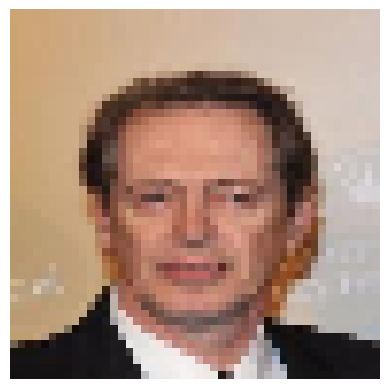

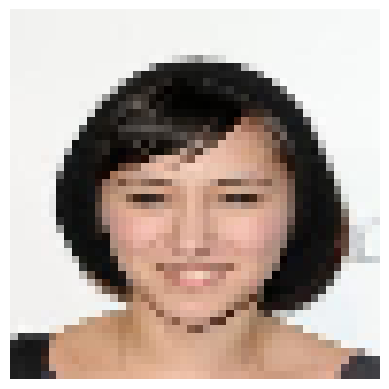

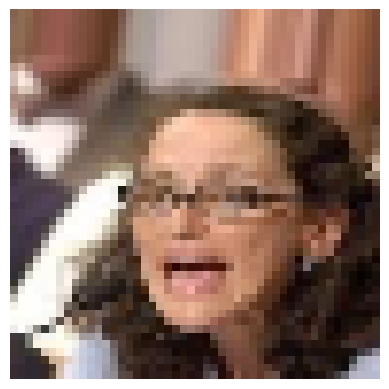

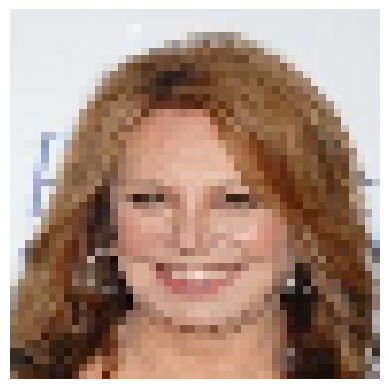

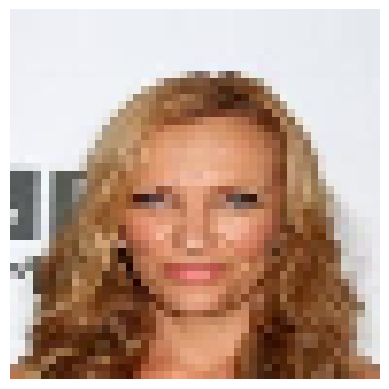

...

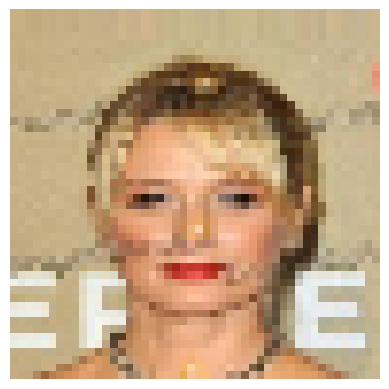

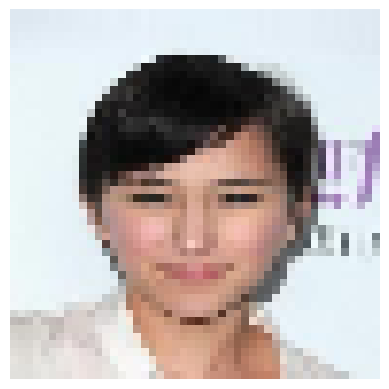

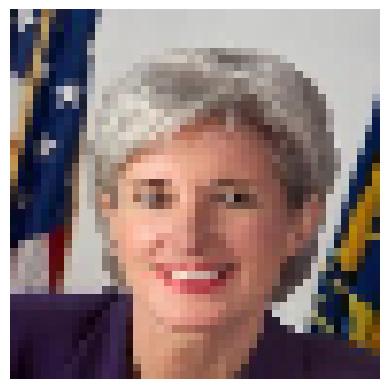

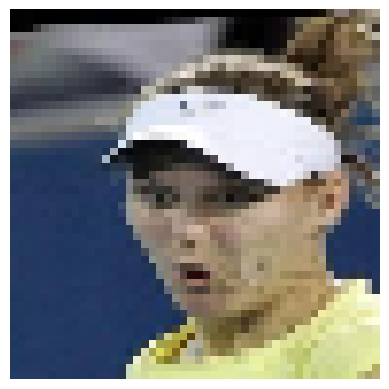

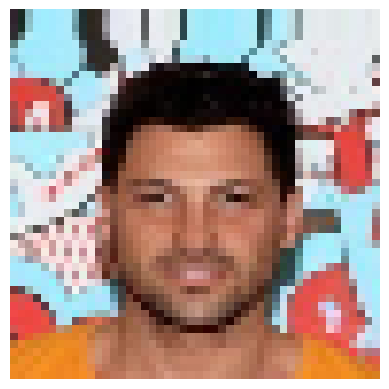

KeyboardInterrupt: 

In [8]:
for batch_index,imgs in enumerate(test_loader):
    for img in imgs:
        img=img.float()
        img=img.permute(1,2,0)
        if img.max() > 1.0:
            img=img / 255.0
        plt.imshow(img)
        plt.axis('off')
        plt.show()

        #print(img.shape,img.dtype)

In [7]:
def q_sampler(x0,t,eps=None):
    if eps is None:
        eps=torch.randn_like(x0)

    alphas_hat=alphas_cumprod[t].view(-1,1,1,1)
    #also: alphas_hat=alphas_cumprod[t].unsqueeze(1).unsqueeze(2).unsqueeze(3)
    result=torch.sqrt(alphas_hat) *x0 + torch.sqrt(1-alphas_hat)*eps
    return result

In [ ]:
#training

epochs=20

for epoch in range(epochs):
    model.train()

    for _,imgs in enumerate(train_loader):
        imgs=imgs.float()
        imgs=imgs / 255.0
        imgs=imgs.to(device)
        print(imgs.shape)
        batch_size=imgs.size(0)
        t=torch.randint(0,T,(batch_size,),device=device).long()
        eps=torch.randn_like(imgs)
        xt=q_sampler(x0=imgs,t=t,eps=eps)
        pred_eps=model(xt,t)
        loss=F.mse_loss(input=pred_eps,target=eps)
        opt.zero_grad()
        loss.backward()
        opt.step()
    print(f' epoch: {epoch} / {epochs}, loss: {loss.item()}')

流式输出内容被截断，只能显示最后 5000 行内容。
h shape:torch.Size([64, 64, 48, 48]), time_emb shape:torch.Size([64, 64, 1, 1])
torch.Size([64, 3, 48, 48])
h shape:torch.Size([64, 64, 48, 48]), time_emb shape:torch.Size([64, 64, 1, 1])
h shape:torch.Size([64, 128, 24, 24]), time_emb shape:torch.Size([64, 128, 1, 1])
h shape:torch.Size([64, 256, 12, 12]), time_emb shape:torch.Size([64, 256, 1, 1])
h shape:torch.Size([64, 256, 12, 12]), time_emb shape:torch.Size([64, 256, 1, 1])
h shape:torch.Size([64, 128, 24, 24]), time_emb shape:torch.Size([64, 128, 1, 1])
h shape:torch.Size([64, 64, 48, 48]), time_emb shape:torch.Size([64, 64, 1, 1])
torch.Size([64, 3, 48, 48])
h shape:torch.Size([64, 64, 48, 48]), time_emb shape:torch.Size([64, 64, 1, 1])
h shape:torch.Size([64, 128, 24, 24]), time_emb shape:torch.Size([64, 128, 1, 1])
h shape:torch.Size([64, 256, 12, 12]), time_emb shape:torch.Size([64, 256, 1, 1])
h shape:torch.Size([64, 256, 12, 12]), time_emb shape:torch.Size([64, 256, 1, 1])
h shape:torch.Size([64,

In [ ]:
#sampling and tracking the reverse process
from torchvision.utils import make_grid

sample_batch_size=8

def sampling_and_tracking(model,img_shape,sample_batch_size):
    step_samples=[]
    x=torch.randn(sample_batch_size,*img_shape,device=device)

    for i in reversed(range(T)):
        t=torch.full((sample_batch_size,),i,dtype=torch.long,device=device)
        pred_eps=model(x,t)
        beta_t=betas[t]
        alpha_t=alphas[t]
        alpha_hat_t=alphas_cumprod(alpha_t)
        coef1=1. / torch.sqrt(alpha_hat_t)
        coef2= beta_t / torch.sqrt(1 - alpha_hat_t)
        x_mu=coef1 * (x- coef2 * pred_eps)

        if i >0:
            x=x_mu + torch.sqrt(beta_t)* torch.randn_like(x)
        else:
            x=x_mu

        step_samples.append(x.clamp(-1,1).detach().cpu())
    return step_samples


def show_grid(images,nrows=sample_batch_size):
    #grid shape (B,H,W)
    grid=make_grid(images,nrow=nrows,normalize=True,value_range=(-1,1))
    plt.imshow(grid.permute(1,2,0))
    plt.axis('off')
    plt.show()





todu: adjust the way of getting the single image shape

In [ ]:
sample_idx=torch.randint(len(ds),(1,)).item()

img,label=ds[sample_idx]

image_shape=img.shape

samples_of_steps=sampling_and_tracking(model=model,img_shape=image_shape,sample_batch_size=sample_batch_size)

for step,imgs_of_step in enumerate(samples_of_steps):
    plt.figure(figsize=(10,10))
    plt.title(f'step {step} / {T}')
    show_grid(imgs_of_step)